# 

In [5]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

![vertex](images/slice_cali_area.png)
## SAR Dataset
* 8290 SAR Frames
* 1.6 TB

## Index Configuration
* 2.9 million tiles, 25x25km, .25 stride
* 1.7 million tiles, 25x25km, .33 stride
* 1.2 million tiles, 20x20km, .5 stride
* 741k tiles, 25x25km, .5 stride
* 329k tiles, 25x25km, .75 stride

In [6]:
import geopandas as gpd
import numpy as np
import pandas as pd
import hyp3_sdk as sdk
import asf_search as asf
import pyproj
import json
import rasterio as rio
import matplotlib.pyplot as plt
import seaborn as sns
import sys

from PIL import Image
from shapely.geometry import Polygon
from config import hyp3_username, hyp3_password
from med_granules import med_granules

In [7]:
sys.path.append('../../SARSearch/src/')
from sarutils import SARUtils

In [3]:
sarutils = SARUtils()
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json', num_tiles=16)

2024-07-09 20:20:34,384 - INFO - Landmask not provided.


Frame S1B_IW_GRDH_1SDV_20201027T134411_20201027T134436_023999_02D9E3_C3EA_VV_landmask.tif has 63 tiles.
Selected frame: S1B_IW_GRDH_1SDV_20201027T134411_20201027T134436_023999_02D9E3_C3EA_VV_landmask.tif


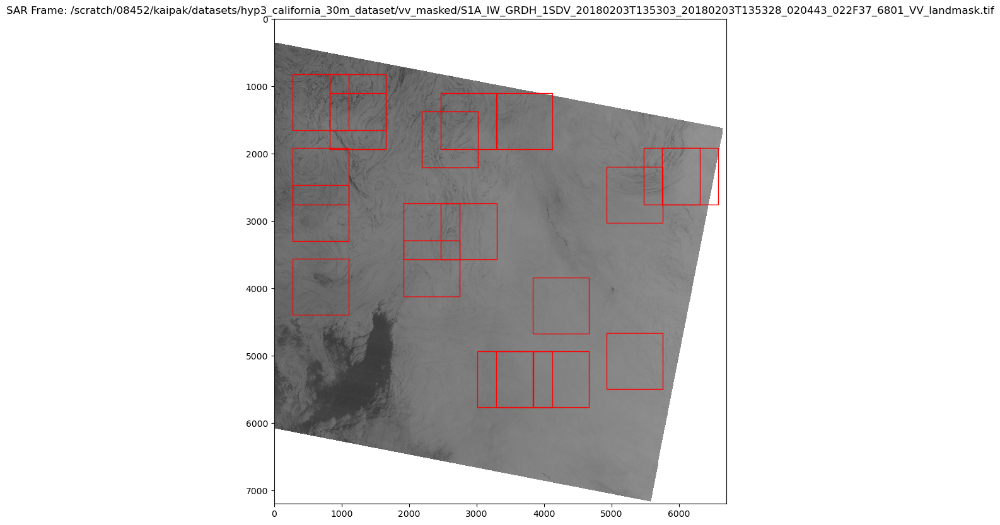

Frame S1A_IW_GRDH_1SDV_20180203T135303_20180203T135328_020443_022F37_6801_VV_landmask.tif has 374 tiles.
Selected frame: S1A_IW_GRDH_1SDV_20180203T135303_20180203T135328_020443_022F37_6801_VV_landmask.tif


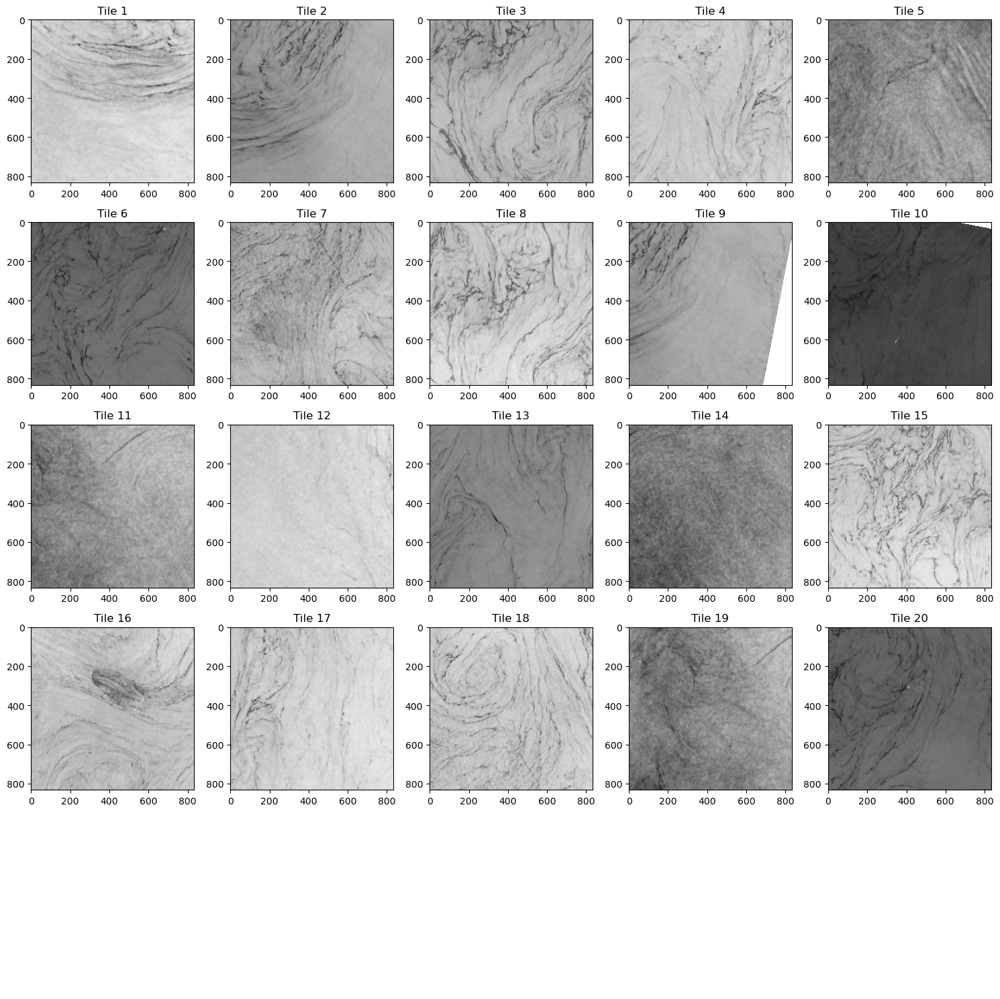

<Figure size 640x480 with 0 Axes>

In [32]:
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json',
                       sar_frame='S1A_IW_GRDH_1SDV_20180203T135303_20180203T135328_020443_022F37_6801_VV_landmask.tif', 
                       num_tiles=20)

In [3]:
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json',
                       sar_frame='S1A_IW_GRDH_1SDV_20170103T014911_20170103T014940_014661_017D92_88FB_VV_landmask.tif', 
                       num_tiles=16)

NameError: name 'sarutils' is not defined

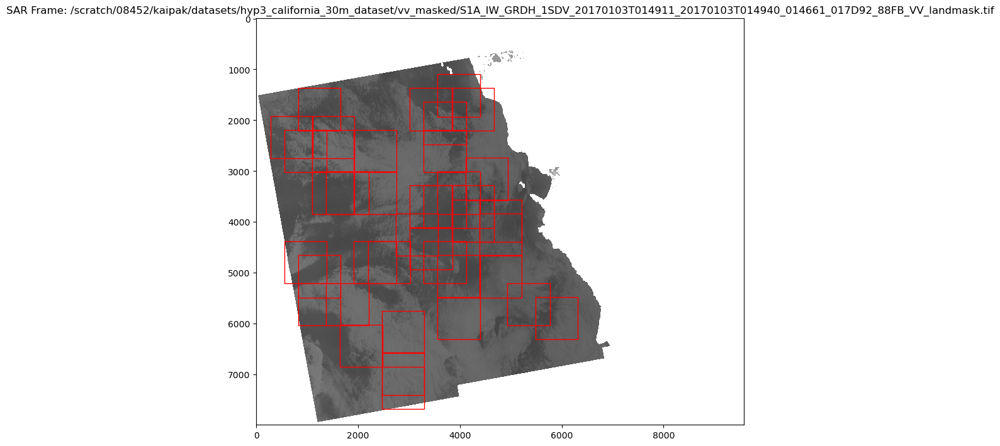

Frame S1A_IW_GRDH_1SDV_20170103T014911_20170103T014940_014661_017D92_88FB_VV_landmask.tif has 345 tiles.
Selected frame: S1A_IW_GRDH_1SDV_20170103T014911_20170103T014940_014661_017D92_88FB_VV_landmask.tif


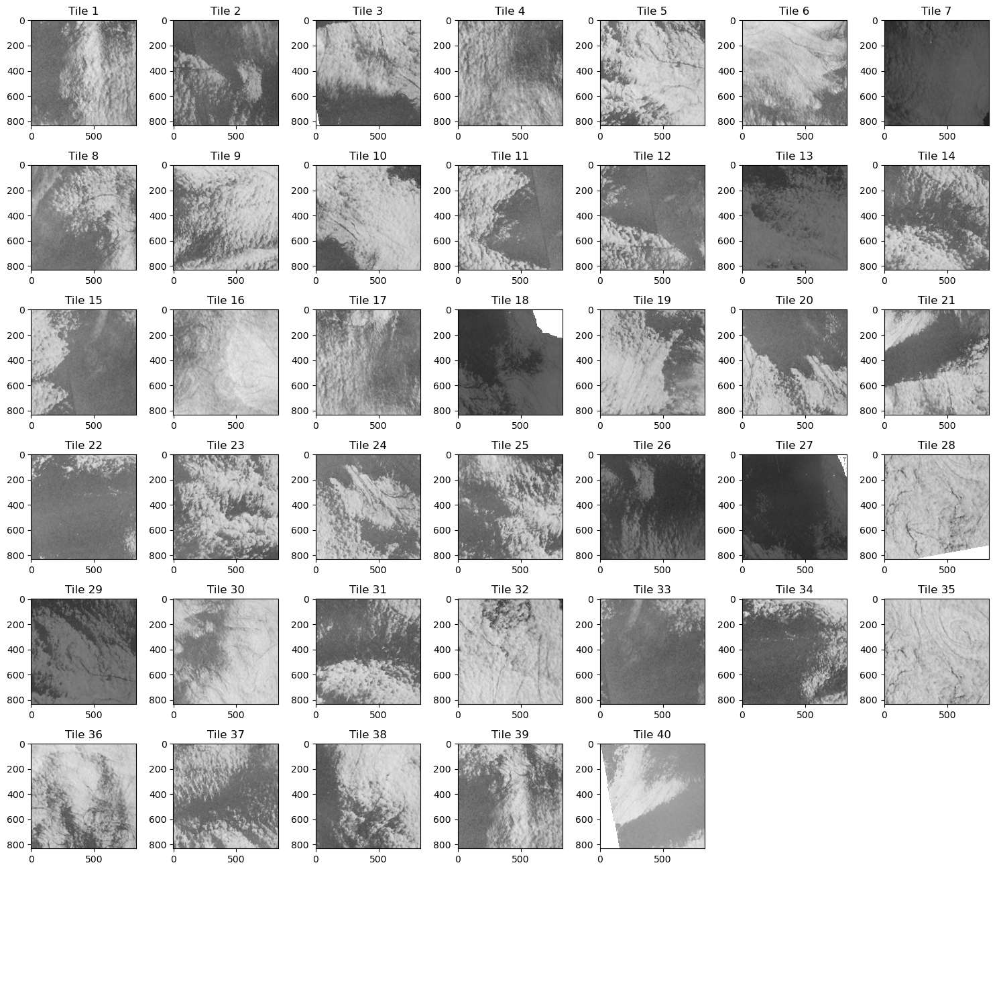

<Figure size 640x480 with 0 Axes>

In [13]:
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json',
                       sar_frame='S1A_IW_GRDH_1SDV_20170103T014911_20170103T014940_014661_017D92_88FB_VV_landmask.tif', 
                       num_tiles=40)

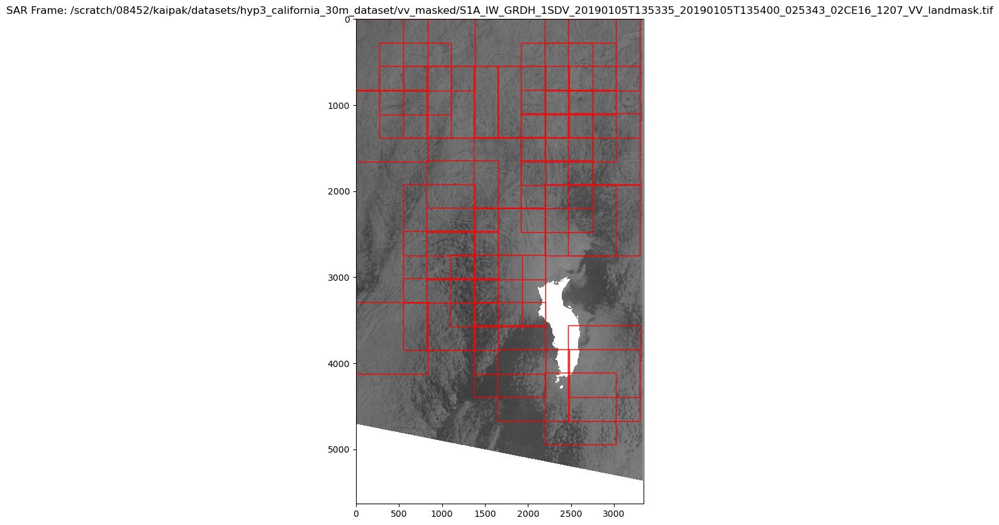

Frame S1A_IW_GRDH_1SDV_20190105T135335_20190105T135400_025343_02CE16_1207_VV_landmask.tif has 148 tiles.
Selected frame: S1A_IW_GRDH_1SDV_20190105T135335_20190105T135400_025343_02CE16_1207_VV_landmask.tif


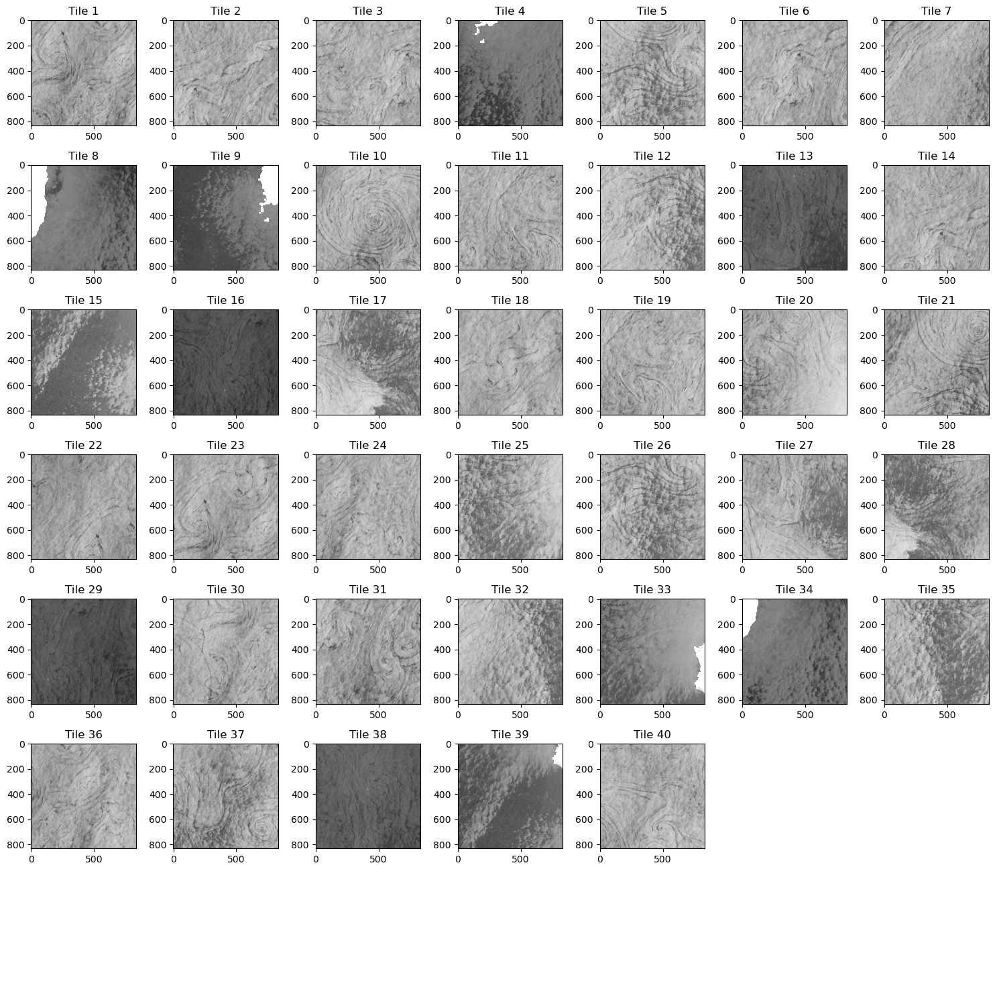

<Figure size 640x480 with 0 Axes>

In [35]:
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json',
                       sar_frame='S1A_IW_GRDH_1SDV_20190105T135335_20190105T135400_025343_02CE16_1207_VV_landmask.tif', 
                       num_tiles=40)

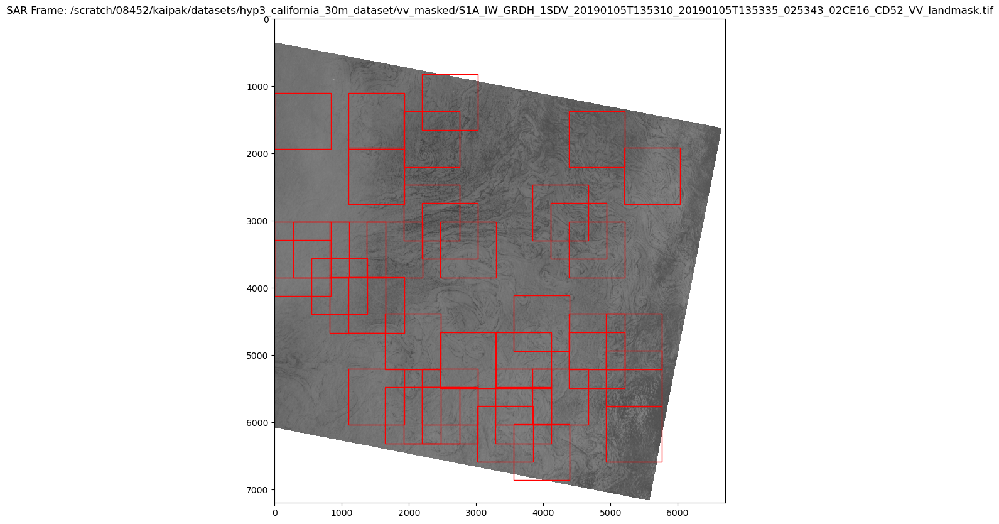

Frame S1A_IW_GRDH_1SDV_20190105T135310_20190105T135335_025343_02CE16_CD52_VV_landmask.tif has 374 tiles.
Selected frame: S1A_IW_GRDH_1SDV_20190105T135310_20190105T135335_025343_02CE16_CD52_VV_landmask.tif


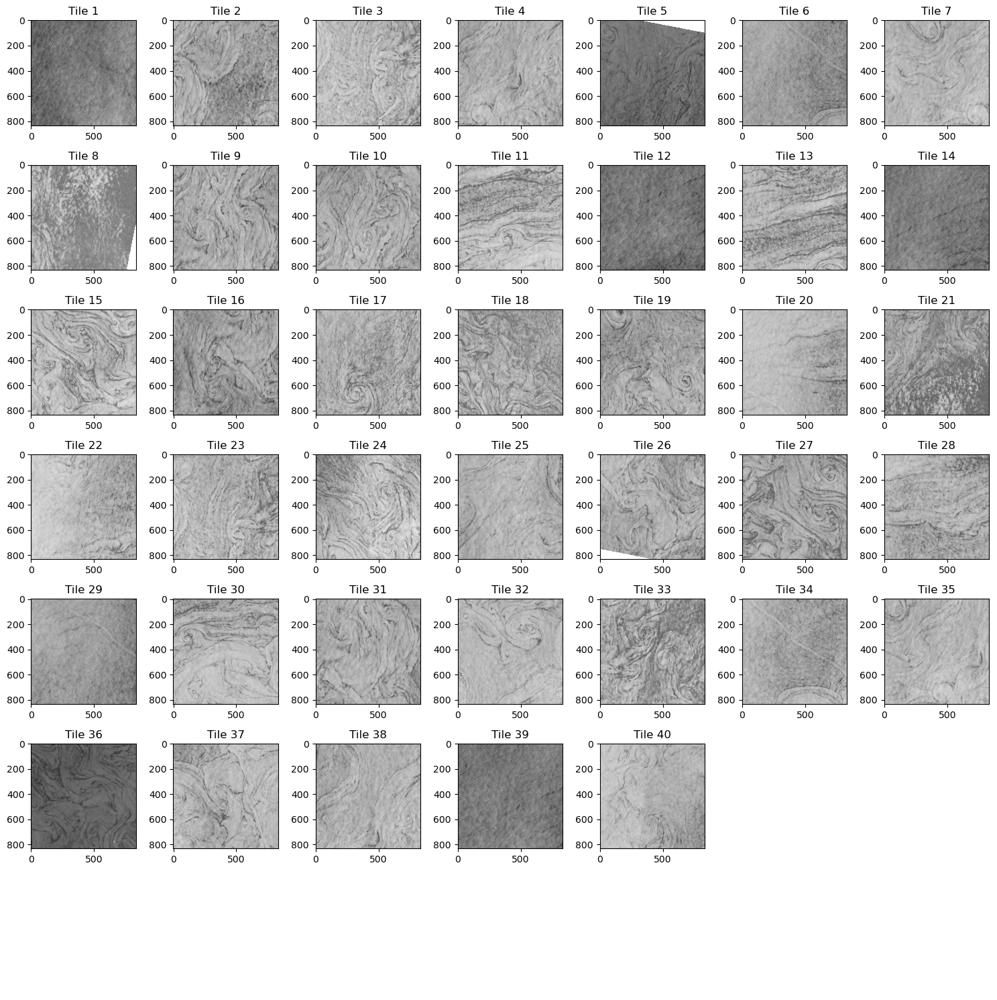

<Figure size 640x480 with 0 Axes>

In [36]:
sarutils.preview_tiles('/work/08452/kaipak/ls6/dev/SARSearch/src/SAR_tile_map_ts833_stride0.33_land0.1_tiles1696586.json',
                       sar_frame='S1A_IW_GRDH_1SDV_20190105T135310_20190105T135335_025343_02CE16_CD52_VV_landmask.tif',
                       num_tiles=40)

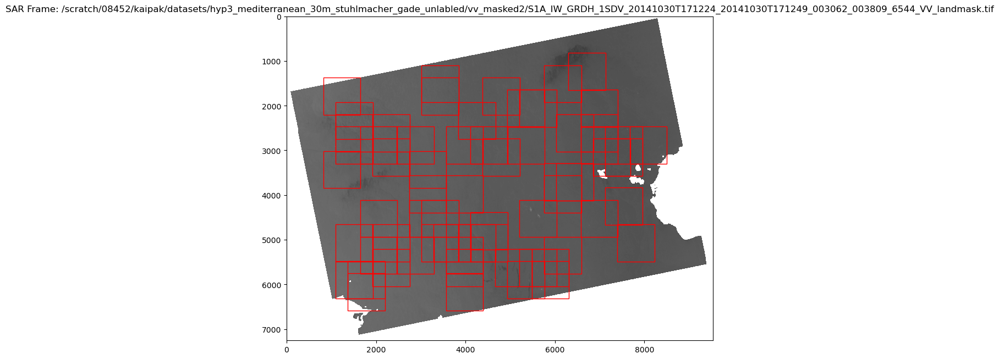

Frame S1A_IW_GRDH_1SDV_20141030T171224_20141030T171249_003062_003809_6544_VV_landmask.tif has 490 tiles.
Selected frame: S1A_IW_GRDH_1SDV_20141030T171224_20141030T171249_003062_003809_6544_VV_landmask.tif


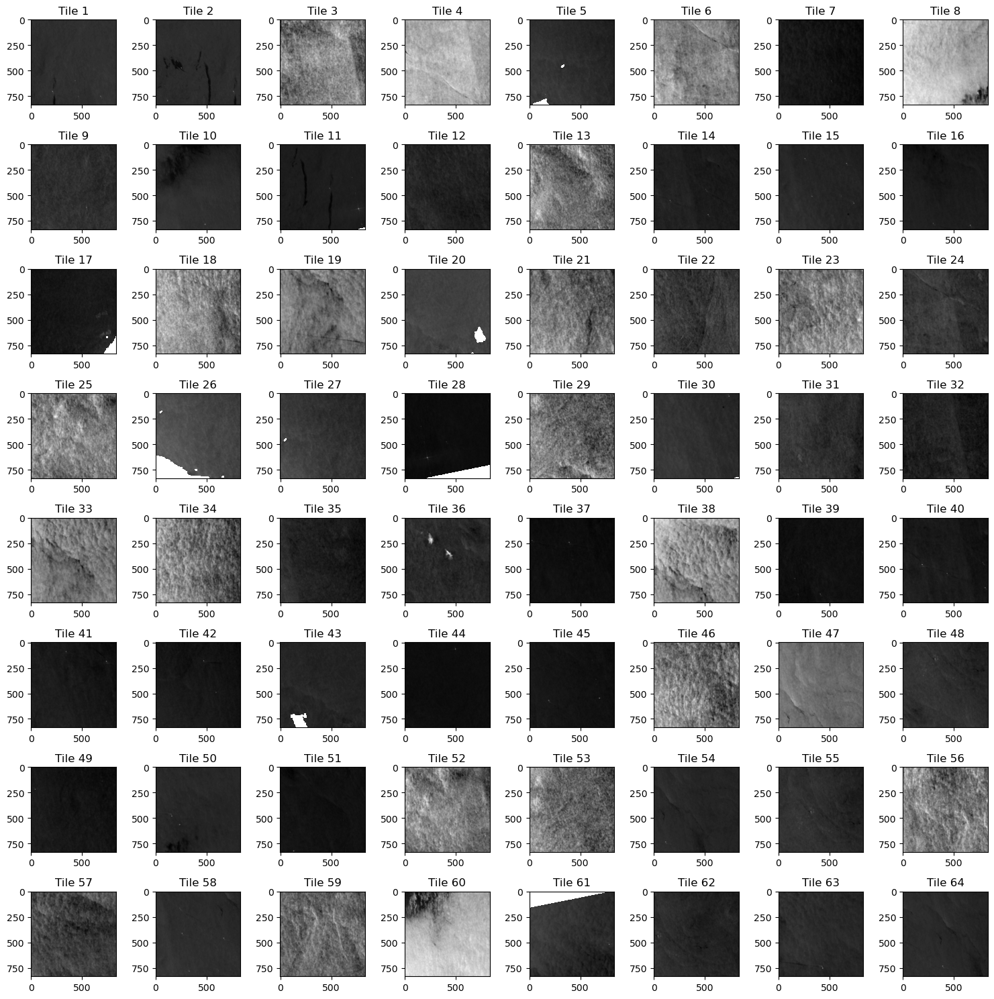

<Figure size 640x480 with 0 Axes>

In [23]:
sarutils.preview_tiles('datasets/SAR_tile_map_ts833_stride0.33_land0.1_tiles29471.json', num_tiles=64)